# IMPORT LIBRARIES

In [ ]:
# DATASET LINK
# https://www.kaggle.com/datasets/sachinkumar413/alzheimer-mri-dataset

# SE3 link: https://github.com/IritaSee/se3gcnn-medical

In [1]:
!git clone https://github.com/IritaSee/se3gcnn-medical

Cloning into 'se3gcnn-medical'...
remote: Enumerating objects: 503, done.
remote: Counting objects: 100% (503/503), done.
remote: Compressing objects: 100% (331/331), done.
remote: Total 503 (delta 148), reused 503 (delta 148), pack-reused 0 (from 0)
Receiving objects: 100% (503/503), 23.65 MiB | 34.49 MiB/s, done.
Resolving deltas: 100% (148/148), done.


In [2]:
import tensorflow as tf
import numpy as np
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import os
from sklearn.model_selection import train_test_split
import shutil
import math as m

# THE CONVOLUTION LAYERS

In [ ]:
def z2_se2n(input_tensor, kernel, orientations_nb, periodicity=2 * np.pi, diskMask=True, padding='VALID'):
    """ Constructs a group convolutional layer. """

    # Print the base kernel
    print("Base Kernel:\n", kernel.numpy())

    # Preparation for group convolutions
    kernel_stack = rotate_lifting_kernels(kernel, orientations_nb, periodicity=periodicity, diskMask=diskMask)
    print("Z2-SE2N ROTATED KERNEL SET SHAPE:", kernel_stack.get_shape())  # Debug

    # Format the kernel stack as a 2D kernel stack (merging the rotation and channelsOUT axis)
    kernels_as_if_2D = tf.transpose(kernel_stack, [1, 2, 3, 0, 4])
    kernelSizeH, kernelSizeW, channelsIN, channelsOUT = map(int, kernel.shape)
    kernels_as_if_2D = tf.reshape(kernels_as_if_2D, [kernelSizeH, kernelSizeW, channelsIN, orientations_nb * channelsOUT])

    # Perform the 2D convolution
    layer_output = tf.nn.conv2d(input=input_tensor, filters=kernels_as_if_2D, strides=[1, 1, 1, 1], padding=padding)

    # Reshape to an SE2 image
    layer_output = tf.reshape(layer_output, [tf.shape(layer_output)[0], int(layer_output.shape[1]), int(layer_output.shape[2]), orientations_nb, channelsOUT])
    print("OUTPUT SE2N ACTIVATIONS SHAPE:", layer_output.get_shape())  # Debug

    return layer_output, kernel_stack


In [ ]:
def se2n_se2n(
        input_tensor,
        kernel,

        # Optional:
        periodicity=2 * np.pi,
        diskMask=True,
        padding='VALID'):

    # Kernel dimensions
    kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT = map(
        int, kernel.shape)

    # Preparation for group convolutions
    # Precompute a rotated stack of se2 kernels
    # With shape: [orientations_nb, kernelSizeH, kernelSizeW, orientations_nb,
    # channelsIN, channelsOUT]
    kernel_stack = rotate_gconv_kernels(kernel, periodicity, diskMask)
    print("SE2N-SE2N ROTATED KERNEL SET SHAPE:",
          kernel_stack.get_shape())  # Debug

    # Group convolutions are done by integrating over [x,y,theta,input-channels] for each translation and rotation of the kernel
    # We compute this integral by doing standard 2D convolutions (translation part) for each rotated version of the kernel (rotation part)
    # In order to efficiently do this we use 2D convolutions where the theta
    # and input-channel axes are merged (thus treating the SE2 image as a 2D
    # feature map)

    # Prepare the input tensor (merge the orientation and channel axis) for
    # the 2D convolutions:
    input_tensor_as_if_2D = tf.reshape(
        input_tensor, [tf.shape(input_tensor)[0], int(input_tensor.shape[1]), int(input_tensor.shape[2]), orientations_nb * channelsIN])

    # Reshape the kernels for 2D convolutions (orientation+channelsIN axis are
    # merged, rotation+channelsOUT axis are merged)
    kernels_as_if_2D = tf.transpose(kernel_stack, [1, 2, 3, 4, 0, 5])
    kernels_as_if_2D = tf.reshape(
        kernels_as_if_2D, [kernelSizeH, kernelSizeW, orientations_nb * channelsIN, orientations_nb * channelsOUT])

    # Perform the 2D convolutions
    layer_output = tf.nn.conv2d(
        input=input_tensor_as_if_2D,
        filters=kernels_as_if_2D,
        strides=[1, 1, 1, 1],
        padding=padding)

    # Reshape into an SE2 image (split the orientation and channelsOUT axis)
    layer_output = tf.reshape(
        layer_output, [tf.shape(layer_output)[0], int(layer_output.shape[1]), int(layer_output.shape[2]), orientations_nb, channelsOUT])
    print("OUTPUT SE2N ACTIVATIONS SHAPE:", layer_output.get_shape())  # Debug

    return layer_output, kernel_stack

# THE MAX-POOLING LAYER

In [ ]:
def spatial_max_pool(input_tensor, nbOrientations, padding='SAME'):
    activations = [None] * nbOrientations
    for i in range(nbOrientations):
        # Apply max-pooling along the height and width dimensions (axis 1 and 2)
        activations[i] = tf.nn.max_pool(
            value=input_tensor[:, :, :, i, :],
            ksize=[1, 2, 2, 1],
            strides=[1, 2, 2, 1],
            padding=padding
        )

    # Re-stack all the pooled activations along the orientation dimension
    tensor_pooled = tf.stack(activations, axis=-1)

    return tensor_pooled

# KERNEL ROTATION FUNCTIONS

In [ ]:
import tensorflow as tf
import numpy as np

def rotate_lifting_kernels(kernel, orientations_nb, periodicity=2 * np.pi, diskMask=True):
    """ Rotates the set of 2D lifting kernels.

        INPUT:
            - kernel, a TensorFlow tensor with expected shape:
                [kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT]
            - orientations_nb, an integer specifying the number of rotations

        INPUT (optional):
            - periodicity, rotate in total over 2*np.pi or np.pi
            - disk_mask, True or False, specifying whether or not to mask the kernels spatially

        OUTPUT:
            - set_of_rotated_kernels, a TensorFlow tensor with dimensions:
                [kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT]
    """

    # Get the shape of the input kernel
    kernel_shape = kernel.shape.as_list()
    kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT = kernel_shape

    # Create a list to store the rotated kernels
    rotated_kernels = []

    for angle in range(orientations_nb):
        rotation_angle = (angle * periodicity) / orientations_nb

        rotated_slices = []

        for channel_index in range(channelsIN):
            original_slice = kernel[:, :, angle, channel_index, :]

            # Create a rotation matrix
            rotation_matrix = np.array([[np.cos(rotation_angle).astype(np.float32), -np.sin(rotation_angle).astype(np.float32)],
                                        [np.sin(rotation_angle).astype(np.float32), np.cos(rotation_angle).astype(np.float32)]])

            # Apply the rotation to the original slice
            rotated_slice = tf.tensordot(original_slice, rotation_matrix, axes=[[0, 1], [0, 1]])
            rotated_slices.append(rotated_slice)

        rotated_kernel_slice = tf.stack(rotated_slices, axis=-1)
        rotated_kernels.append(rotated_kernel_slice)

    # Stack the rotated kernels along the orientations axis
    set_of_rotated_kernels = tf.stack(rotated_kernels, axis=2)

    return set_of_rotated_kernels


In [ ]:
def rotate_lifting_kernels(kernel, orientations_nb, periodicity=2 * np.pi, diskMask=True):
    """ Rotates the set of 2D lifting kernels.
        INPUT:
            - kernel, a tensor flow tensor with expected shape:
                [Height, Width, ChannelsIN, ChannelsOUT]
            - orientations_nb, an integer specifying the number of rotations

        INPUT (optional):
            - periodicity, rotate in total over 2*np.pi or np.pi
            - disk_mask, True or False, specifying whether or not to mask the kernels spatially

        OUTPUT:
            - set_of_rotated_kernels, a tensorflow tensor with dimensions:
                [nbOrientations, Height, Width, ChannelsIN, ChannelsOUT]"""
    # Unpack the shape of the input kernel
    kernelSizeH, kernelSizeW, channelsIN, channelsOUT = map(int, kernel.shape)
    print("Z2-SE2N BASE KERNEL SHAPE:", kernel.get_shape())  # Debug

    # Flatten the baseline kernel
    # Resulting shape: [kernelSizeH*kernelSizeW, channelsIN*channelsOUT]
    kernel_flat = tf.reshape(
        kernel, [kernelSizeH * kernelSizeW, channelsIN * channelsOUT])

    # Generate a set of rotated kernels via rotation matrix multiplication
    # For efficiency purpose, the rotation matrix is implemented as a sparse matrix object
    # Result: The non-zero indices and weights of the rotation matrix
    idx, vals = MultiRotationOperatorMatrixSparse(
        [kernelSizeH, kernelSizeW],
        orientations_nb,
        periodicity=periodicity,
        diskMask=diskMask)

    # Sparse rotation matrix
    # Resulting shape: [nbOrientations*kernelSizeH*kernelSizeW,
    # kernelSizeH*kernelSizeW]
    rotOp_matrix = tf.SparseTensor(
        idx, vals,
        [orientations_nb * kernelSizeH * kernelSizeW, kernelSizeH * kernelSizeW])

    # Matrix multiplication
    # Resulting shape: [nbOrientations*kernelSizeH*kernelSizeW,
    # channelsIN*channelsOUT]
    set_of_rotated_kernels = tf.sparse_tensor_dense_matmul(
        rotOp_matrix, kernel_flat)

    # Reshaping
    # Resulting shape: [nbOrientations, kernelSizeH, kernelSizeW, channelsIN,
    # channelsOUT]
    set_of_rotated_kernels = tf.reshape(
        set_of_rotated_kernels, [orientations_nb, kernelSizeH, kernelSizeW, channelsIN, channelsOUT])

    return set_of_rotated_kernels

In [ ]:
def rotate_gconv_kernels(kernel, periodicity=2 * np.pi, diskMask=True):
    """ Rotates the set of SE2 kernels.
        Rotation of SE2 kernels involves planar rotations and a shift in orientation,
        see e.g. the left-regular representation L_g of the roto-translation group on SE(2) images,
        (Eq. 3) of the MICCAI 2018 paper.

        INPUT:
            - kernel, a tensor flow tensor with expected shape:
                [Height, Width, nbOrientations, ChannelsIN, ChannelsOUT]

        INPUT (optional):
            - periodicity, rotate in total over 2*np.pi or np.pi
            - disk_mask, True or False, specifying whether or not to mask the kernels spatially

        OUTPUT:
            - set_of_rotated_kernels, a tensorflow tensor with dimensions:
                [nbOrientations, Height, Width, nbOrientations, ChannelsIN, ChannelsOUT]
              I.e., for each rotation angle a rotated (shift-twisted) version of the input kernel.
    """

    # Rotation of an SE2 kernel consists of two parts:
    # PART 1. Planar rotation
    # PART 2. A shift in theta direction

    # Unpack the shape of the input kernel
    kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT = map(
        int, kernel.shape)
    print("SE2N-SE2N BASE KERNEL SHAPE:", kernel.get_shape())  # Debug

    # PART 1 (planar rotation)
    # Flatten the baseline kernel
    # Resulting shape: [kernelSizeH*kernelSizeW,orientations_nb*channelsIN*channelsOUT]
    #
    kernel_flat = tf.reshape(
        kernel, [kernelSizeH * kernelSizeW, orientations_nb * channelsIN * channelsOUT])

    # Generate a set of rotated kernels via rotation matrix multiplication
    # For efficiency purpose, the rotation matrix is implemented as a sparse matrix object
    # Result: The non-zero indices and weights of the rotation matrix
    idx, vals = rotation_matrix.MultiRotationOperatorMatrixSparse(
        [kernelSizeH, kernelSizeW],
        orientations_nb,
        periodicity=periodicity,
        diskMask=diskMask)

    # The corresponding sparse rotation matrix
    # Resulting shape: [nbOrientations*kernelSizeH*kernelSizeW,kernelSizeH*kernelSizeW]
    #
    rotOp_matrix = tf.SparseTensor(
        idx, vals,
        [orientations_nb * kernelSizeH * kernelSizeW, kernelSizeH * kernelSizeW])

    # Matrix multiplication (each 2D plane is now rotated)
    # Resulting shape: [nbOrientations*kernelSizeH*kernelSizeW, orientations_nb*channelsIN*channelsOUT]
    #
    kernels_planar_rotated = tf.sparse_tensor_dense_matmul(
        rotOp_matrix, kernel_flat)
    kernels_planar_rotated = tf.reshape(
        kernels_planar_rotated, [orientations_nb, kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT])

    # PART 2 (shift in theta direction)
    set_of_rotated_kernels = [None] * orientations_nb
    for orientation in range(orientations_nb):
        # [kernelSizeH,kernelSizeW,orientations_nb,channelsIN,channelsOUT]
        kernels_temp = kernels_planar_rotated[orientation]
        # [kernelSizeH,kernelSizeW,channelsIN,channelsOUT,orientations_nb]
        kernels_temp = tf.transpose(kernels_temp, [0, 1, 3, 4, 2])
        # [kernelSizeH*kernelSizeW*channelsIN*channelsOUT*orientations_nb]
        kernels_temp = tf.reshape(
            kernels_temp, [kernelSizeH * kernelSizeW * channelsIN * channelsOUT, orientations_nb])
        # Roll along the orientation axis
        roll_matrix = tf.constant(
            np.roll(np.identity(orientations_nb), orientation, axis=1), dtype=tf.float32)
        kernels_temp = tf.matmul(kernels_temp, roll_matrix)
        kernels_temp = tf.reshape(
            kernels_temp, [kernelSizeH, kernelSizeW, channelsIN, channelsOUT, orientations_nb])  # [Nx,Ny,Nin,Nout,Ntheta]
        kernels_temp = tf.transpose(kernels_temp, [0, 1, 4, 2, 3])
        set_of_rotated_kernels[orientation] = kernels_temp

    return tf.stack(set_of_rotated_kernels)

In [ ]:
import tensorflow as tf
import numpy as np

def rotate_lifting_kernels(kernel, orientations_nb, periodicity=2 * np.pi, diskMask=True):
    kernelSizeH, kernelSizeW, channelsIN, channelsOUT = map(int, kernel.shape)
    print("Z2-SE2N BASE KERNEL SHAPE:", kernel.get_shape())  # Debug

    # Create an empty list to store rotated kernels
    rotated_kernels = []

    # Iterate over orientations and apply the rotations manually
    for orientation in range(orientations_nb):
        angle = orientation * periodicity / orientations_nb
        rotated_kernel = tf.keras.layers.experimental.preprocessing.Resizing(
            kernelSizeH, kernelSizeW)(kernel)  # Resize to the original size
        rotated_kernel = tf.keras.layers.experimental.preprocessing.Resizing(
            kernelSizeH, kernelSizeW, interpolation="bilinear")(rotated_kernel)  # Bilinear interpolation for rotation
        rotated_kernels.append(rotated_kernel)

    # Stack the rotated kernels along the orientation axis
    set_of_rotated_kernels = tf.stack(rotated_kernels, axis=-1)

    return set_of_rotated_kernels

def rotate_gconv_kernels(kernel, periodicity=2 * np.pi, diskMask=True):
    kernelSizeH, kernelSizeW, orientations_nb, channelsIN, channelsOUT = map(
        int, kernel.shape)
    print("SE2N-SE2N BASE KERNEL SHAPE:", kernel.get_shape())  # Debug

    # Create an empty list to store rotated kernels
    rotated_kernels = []

    # Iterate over orientations and apply the rotations manually
    for orientation in range(orientations_nb):
        angle = orientation * periodicity / orientations_nb
        rotated_kernel = tf.keras.layers.experimental.preprocessing.Resizing(
            kernelSizeH, kernelSizeW)(kernel)  # Resize to the original size
        rotated_kernel = tf.keras.layers.experimental.preprocessing.Resizing(
            kernelSizeH, kernelSizeW, interpolation="bilinear")(rotated_kernel)  # Bilinear interpolation for rotation
        rotated_kernels.append(rotated_kernel)

    # Stack the rotated kernels along the orientation axis
    set_of_rotated_kernels = tf.stack(rotated_kernels, axis=-1)

    return set_of_rotated_kernels


# ROTATION MATRIX

In [ ]:
def CoordRotationInv(ij, NiNj, theta):
    """ Appplies the inverse rotation transformation on input coordinates (i,j).
        The rotation is around the center of the image with dimensions Ni, Nj
        (resp. # of rows and colums). Input theta is the applied rotation.

        INPUT:
            - ij, a list of length 2 containing the i and j coordinate as [i,j]
            - NiNj, a list of length 2 containing the dimensions of the 2D domain
              as [Ni, Nj]
            - theta, a real number specifying the angle of rotations

        OUTPUT:
            - ijOld, a list of length 2 containing the new coordinate of the
              inverse rotation, i.e., the old coordinate which was mapped to
              the new one via (forward) rotation over theta.
    """

    # Define the center of rotation
    centeri = m.floor(NiNj[0] / 2)
    centerj = m.floor(NiNj[1] / 2)

    # Compute the output of the inverse rotation transformation
    ijOld = np.zeros([2])
    ijOld[0] = m.cos(theta) * (ij[0] - centeri) + \
        m.sin(theta) * (ij[1] - centerj) + centeri
    ijOld[1] = -1 * m.sin(theta) * (ij[0] - centeri) + \
        m.cos(theta) * (ij[1] - centerj) + centerj

    # Return the "old" indices
    return ijOld

In [ ]:
def LinIntIndicesAndWeights(ij, NiNj):
    """ Returns, given a target index (i,j), the 4 neighbouring indices and
        their corresponding weights used for linear interpolation.

        INPUT:
            - ij, a list of length 2 containing the i and j coordinate
              as [i,j]
            - NiNj, a list of length 2 containing the dimensions of the 2D
              domain as [Ni,Nj]

        OUTPUT:
            - indicesAndWeights, a list index-weight pairs as [[i0,j0,w00],
              [i0,j1,w01],...]
    """

    # The index where want to obtain the value
    i = ij[0]
    j = ij[1]
    # Image size
    Ni = NiNj[0]
    Nj = NiNj[1]

    # The neighbouring indices
    i1 = int(m.floor(i))  # -- to integer format
    i2 = i1 + 1
    j1 = int(m.floor(j))  # -- to integer format
    j2 = j1 + 1

    # The 1D weights
    ti = i - i1
    tj = j - j1

    # The 2D weights
    w11 = (1 - ti) * (1 - tj)
    w12 = (1 - ti) * tj
    w21 = ti * (1 - tj)
    w22 = ti * tj

    # Only add indices and weights if they fall in the range of the image with
    # dimensions NiNj
    indicesAndWeights = []
    if (0 <= i1 < Ni) and (0 <= j1 < Nj):
        indicesAndWeights.append([i1, j1, w11])
    if (0 <= i1 < Ni) and (0 <= j2 < Nj):
        indicesAndWeights.append([i1, j2, w12])
    if (0 <= i2 < Ni) and (0 <= j1 < Nj):
        indicesAndWeights.append([i2, j1, w21])
    if (0 <= i2 < Ni) and (0 <= j2 < Nj):
        indicesAndWeights.append([i2, j2, w22])

    return indicesAndWeights

In [ ]:
def ToLinearIndex(ij, NiNj):
    """ Returns the linear index of a flattened 2D image that has dimensions
        [Ni,Nj] before flattening.

        INPUT:
            - ij, a list of length 2 containing the i and j coordinate
              as [i,j]
            - NiNj, a list of length 2 containing the dimensions of the 2D
              domain as [Ni,Nj]

        OUTPUT:
            - ijFlat = ij[0] * NiNj[0] + ij[1]
    """

    return ij[0] * NiNj[0] + ij[1]

In [ ]:
def RotationOperatorMatrix(NiNj, theta, diskMask=True):
    """ Returns the matrix that rotates a square image by R.f, where f is the
        flattend image (a vector of length Ni*Nj).
        The resulting vector needs to be repartitioned in to a [Ni,Nj] sized image later.

        INPUT:
            - NiNj, a list of length 2 containing the dimensions of the 2D
              domain as [Ni,Nj]
            - theta, a real number specifying the rotation angle

        INPUT (optional):
            - diskMask = True, by default values outside a circular mask are set
              to zero.

        OUTPUT:
            - rotationMatrix, a np.array of dimensions [Ni*Nj,Ni*Nj]
    """

    # Image size
    Ni = NiNj[0]
    Nj = NiNj[1]
    cij = m.floor(Ni / 2)  # center

    # Fill the rotation operator matrix
    rotationMatrix = np.zeros([Ni * Nj, Ni * Nj])
    for i in range(0, NiNj[0]):
        for j in range(0, NiNj[0]):
            # Apply a circular mask (disk matrix) if desired
            if not(diskMask) or ((i - cij) * (i - cij) + (j - cij) * (j - cij) <= (cij + 0.5) * (cij + 0.5)):
                # The row index of the operator matrix
                linij = ToLinearIndex([i, j], NiNj)
                # The interpolation points
                ijOld = CoordRotationInv([i, j], NiNj, theta)
                # The indices used for interpolation and their weights
                linIntIndicesAndWeights = LinIntIndicesAndWeights(ijOld, NiNj)
                # Fill the weights in the rotationMatrix
                for indexAndWeight in linIntIndicesAndWeights:
                    indexOld = [indexAndWeight[0], indexAndWeight[1]]
                    linIndexOld = ToLinearIndex(indexOld, NiNj)
                    weight = indexAndWeight[2]
                    rotationMatrix[linij, linIndexOld] = weight
    return rotationMatrix

In [ ]:
def MultiRotationOperatorMatrix(NiNj, Ntheta, periodicity=2 * np.pi, diskMask=True):
    """ Concatenates multiple operator matrices along the first dimension for a
        direct multi-orientation transformation.
        I.e., this function returns the matrix that rotates a square image over several angles via R.f,
        where f is the flattend image (a vector of length Ni*Nj).
        The dimensions of R are [Ntheta*Ni*Nj], with Ntheta the number of orientations
        sampled from 0 to "periodicity".
        The resulting vector needs to be repartitioned into a [Ntheta,Ni,Nj] stack of rotated images later.

        INPUT:
            - NiNj, a list of length 2 containing the dimensions of the 2D domain as [Ni,Nj]
            - nTheta, an integer specifying the number of rotations

        INPUT (optional):
            - periodicity = 2*np.pi, by default rotations from 0 to 2 pi are considered.
            - diskMask = True, by default values outside a circular mask are set to zero.

        OUTPUT:
            - rotationMatrix, a np.array of dimensions [Ntheta*Ni*Nj,Ni*Nj]
    """
    matrices = [None] * Ntheta
    for r in range(Ntheta):
        matrices[r] = RotationOperatorMatrix(
            NiNj,
            periodicity * r / Ntheta,
            diskMask=diskMask)
    return np.concatenate(matrices, axis=0)

In [ ]:
def RotationOperatorMatrixSparse(NiNj, theta, diskMask=True, linIndOffset=0):
    """ Returns the idx and vals, where idx is a tuple of 2D indices (also as tuples) and vals the corresponding values.
        The indices and weights can be converted to a spare tensorflow matrix via
        R = tf.SparseTensor(idx,vals,[Ni*Nj,Ni*Nj])
        The resulting matrix rotates a square image by R.f, where f is the flattend image (a vector of length Ni*Nj).
        The resulting vector needs to be repartitioned in to a [Ni,Nj] sized image later.

        INPUT:
            - NiNj, a list of length 2 containing the dimensions of the 2D
              domain as [Ni,Nj]
            - theta, a real number specifying the rotation angle

        INPUT (optional):
            - diskMask = True, by default values outside a circular mask are set
              to zero.

        OUTPUT:
            - idx, a tuple containing the non-zero indices (tuples of length 2)
            - vals, the corresponding values at these indices
    """

    # Image size
    Ni = NiNj[0]
    Nj = NiNj[1]
    cij = m.floor(Ni / 2)  # center

    # Fill the rotation operator matrix
    # rotationMatrix = np.zeros([Ni * Nj, Ni * Nj])
    idx = [] # This will contain a list of index tuples
    vals = [] # This will contain the corresponding weights
    for i in range(0, NiNj[0]):
        for j in range(0, NiNj[0]):
            # Apply a circular mask (disk matrix) if desired
            if not(diskMask) or ((i - cij) * (i - cij) + (j - cij) * (j - cij) <= (cij + 0.5) * (cij + 0.5)):
                # The row index of the operator matrix
                linij = ToLinearIndex([i, j], NiNj)
                # The interpolation points
                ijOld = CoordRotationInv([i, j], NiNj, theta)
                # The indices used for interpolation and their weights
                linIntIndicesAndWeights = LinIntIndicesAndWeights(ijOld, NiNj)
                indicesAndWeights = linIntIndicesAndWeights
                # Fill the weights in the rotationMatrix
                for indexAndWeight in linIntIndicesAndWeights:
                    indexOld = [indexAndWeight[0], indexAndWeight[1]]
                    linIndexOld = ToLinearIndex(indexOld, NiNj)
                    weight = indexAndWeight[2]
                    idx = idx + [(linij + linIndOffset, linIndexOld)]
                    vals = vals + [weight]

    # Return the indices and weights as tuples
    return tuple(idx), tuple(vals)

In [ ]:
def MultiRotationOperatorMatrixSparse(NiNj, Ntheta, periodicity=2 * np.pi, diskMask=True):
    """ Returns the idx and vals, where idx is a tuple of 2D indices (also as tuples) and vals the corresponding values.
        The indices and weights can be converted to a sparse tensorflow matrix via
        R = tf.SparseTensor(idx,vals,[Ntheta*Ni*Nj,Ni*Nj]).
        This matrix rotates a square image over several angles via R.f,
        where f is the flattend image (a vector of length Ni*Nj).
        The dimensions of R are [Ntheta*Ni*Nj], with Ntheta the number of orientations
        sampled from 0 to "periodicity".
        The resulting vector needs to be repartitioned into a [Ntheta,Ni,Nj] stack of rotated images later.

        INPUT:
            - NiNj, a list of length 2 containing the dimensions of the 2D
              domain as [Ni,Nj]
            - nTheta, an integer specifying the number of rotations

        INPUT (optional):
            - periodicity = 2*np.pi, by default rotations from 0 to 2 pi are
              considered.
            - diskMask = True, by default values outside a circular mask are set
              to zero.

        OUTPUT:
            - idx, a tuple containing the non-zero indices (tuples of length 2)
            - vals, the corresponding values at these indices
    """
    idx = ()
    vals = ()
    for r in range(Ntheta):
        idxr, valsr = RotationOperatorMatrixSparse(
            NiNj, periodicity * r / Ntheta,
            linIndOffset=r * NiNj[0] * NiNj[1],
            diskMask=diskMask)
        idx = idx + idxr
        vals = vals + valsr
    return idx, vals

# **Data Preparation**

In [ ]:
# import shutil

# # Delete folder
# folder_path = '/kaggle/working/'
# if os.path.exists(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"{folder_path} has been deleted.")
# else:
#     print(f"{folder_path} does not exist.")

In [ ]:
# prompt: import google drive

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

# Define the root directory
# root_dir = '/kaggle/input/brain-tumor-classification-mri/'
root_dir = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/sampled'

# Initialize dictionary to store counts for each class
class_counts = {}

## Traverse through the directory structure (may cause timeout)


# for subdir, dirs, files in os.walk(root_dir):
#     # If the current directory contains files
#     if files:
#         # Extract the class name from the current directory
#         class_name = os.path.basename(subdir)
#         # Update the count for the class
#         class_counts[class_name] = class_counts.get(class_name, 0) + len(files)

# # Display the count for each class
# for class_name, count in class_counts.items():
#     print(f"{class_name}: {count}")

In [ ]:
import os
import random
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img, load_img

# Define the data directory
# data_dir = '/kaggle/input/brain-tumor-classification-mri/'  # Change this to the path of your dataset folder

# # Define the directories for train, validation, and test sets
# train_dir = '/kaggle/working/train'  # Create these directories
# val_dir = '/kaggle/working/val'  # Create these directories
# test_dir = '/kaggle/working/test'  # Create these directories

# # Create class directories within train, validation, and test
# class_names = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']
# for class_name in class_names:
#     os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
#     os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
#     os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)



# Define the percentage of data for each set
train_percentage = 0.7
val_percentage = 0.15
test_percentage = 0.15

# Define the minimum number of samples for each class in each set
# min_samples = 800  # Ensuring "no_tumor" has at least 800 samples

# # Define data augmentation parameters
# datagen = ImageDataGenerator(
#     horizontal_flip=True,
#     vertical_flip=True,
#     rotation_range=15,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     shear_range=0.1,
#     zoom_range=0.2,
#     fill_mode='nearest'
# )

# # Copy images to the train, validation, and test directories while balancing the classes
# for class_name in class_names:
#     class_dir = os.path.join(data_dir, class_name)
#     images = os.listdir(class_dir)
#     random.shuffle(images)

#     if class_name == 'no_tumor':
#         num_samples = min_samples
#     else:
#         num_samples = min(min_samples, len(images))

#     # Oversample the "no_tumor" class using data augmentation
#     if class_name == 'no_tumor':
#         augmented_samples = 0
#         for img in images[:num_samples]:
#             img_path = os.path.join(class_dir, img)
#             image = img_to_array(load_img(img_path))
#             image = image.reshape((1,) + image.shape)
#             augmentations = datagen.flow(image, batch_size=1)
#             for _ in range(4):  # Augment each image four times to reach a total of five images per original image
#                 if augmented_samples < min_samples:
#                     augmented_images = next(augmentations)
#                     augmented_image = array_to_img(augmented_images[0], scale=True)
#                     augmented_image.save(os.path.join(train_dir, class_name, f'{img[:-4]}_aug_{augmented_samples}.jpg'))
#                     augmented_samples += 1

#     else:
#         for img in images[:num_samples]:
#             shutil.copy(os.path.join(class_dir, img), os.path.join(train_dir, class_name, img))

# # Splitting augmented data into train, validation, and test sets
# for class_name in class_names:
#     class_dir = os.path.join(train_dir, class_name)
#     images = os.listdir(class_dir)
#     random.shuffle(images)

#     num_train = int(train_percentage * len(images))
#     num_val = int(val_percentage * len(images))
#     num_test = len(images) - num_train - num_val

#     for img in images[:num_train]:
#         shutil.move(os.path.join(class_dir, img), os.path.join(train_dir, class_name, img))
#     for img in images[num_train:num_train + num_val]:
#         shutil.move(os.path.join(class_dir, img), os.path.join(val_dir, class_name, img))
#     for img in images[num_train + num_val:]:
#         shutil.move(os.path.join(class_dir, img), os.path.join(test_dir, class_name, img))

In [ ]:
# # prompt: delete any folder found inside root_dir+'/*'

# import shutil
# import os

# # root_dir = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only' # Replace with your actual root directory

# for filename in os.listdir(root_dir+'/Metastases'):
#     file_path = os.path.join(root_dir+'/Metastases', filename)
#     # print(file_path)
#     if not ".png" in file_path:
#         os.rmdir(file_path)
#         print(f"Deleted folder: {file_path}")


In [ ]:
# prompt: use tensorflow preprocessing flow from directory and continue generate imagedatagenerator

# Assuming you have the necessary imports and functions from the previous code.
import tensorflow as tf

# Define image size and batch size
IMG_SIZE = (224, 224)
# BATCH_SIZE = 32
BATCH_SIZE= 512

# Create the preprocessing flow using tf.keras.utils.image_dataset_from_directory
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.2,
    # rotation_range=15,
    # width_shift_range=0.1,
    # height_shift_range=0.1,
    # shear_range=0.1,
    # zoom_range=0.2,
    # horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    root_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Change to 'categorical' for multi-class classification
    shuffle=True,
    subset = "training",
    # classes=CLASSES,  # Specify class names
    seed=42
)


# val_datagen = ImageDataGenerator(rescale=1.0 / 255)

validation_generator = train_datagen.flow_from_directory(
    root_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Change to 'categorical' for multi-class classification
    shuffle=False,
    # classes=CLASSES,  # Specify class names
    subset="validation",
    seed=42
)




# val_ds = tf.keras.utils.image_dataset_from_directory(
#     root_dir,
#     # labels='inferred',
#     label_mode='categorical',
#     image_size=IMG_SIZE,
#     interpolation='nearest',
#     batch_size=BATCH_SIZE,
#     shuffle=False,
#     validation_split=0.2,
#     subset="validation",
#     seed=123
# )

# # Further augment the data using ImageDataGenerator
# datagen = ImageDataGenerator(
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     horizontal_flip=True
# )


# You can now use train_ds and val_ds with your model.
# Example using the model.fit method
# model.fit(train_ds, epochs=10, validation_data=val_ds)


Found 3878 images belonging to 5 classes.
Found 969 images belonging to 5 classes.


### Prepare & Balance dataset

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# # Define the data directories
# train_dir = '/kaggle/working/train'
# val_dir = '/kaggle/working/val'
# test_dir = '/kaggle/working/test'

# # Set parameters
# batch_size = 8
# image_size = (224, 224)
# CLASSES = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']

# # Create data generators for training, validation, and testing
# train_datagen = ImageDataGenerator(
#     rescale=1.0 / 255,
#     rotation_range=15,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     shear_range=0.1,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     fill_mode='nearest'
# )

# train_generator = train_datagen.flow_from_directory(
#     train_dir,
#     target_size=image_size,
#     batch_size=batch_size,
#     class_mode='categorical',  # Change to 'categorical' for multi-class classification
#     shuffle=True,
#     classes=CLASSES,  # Specify class names
#     seed=42
# )

# val_datagen = ImageDataGenerator(rescale=1.0 / 255)

# validation_generator = val_datagen.flow_from_directory(
#     val_dir,
#     target_size=image_size,
#     batch_size=batch_size,
#     class_mode='categorical',  # Change to 'categorical' for multi-class classification
#     shuffle=False,
#     classes=CLASSES,  # Specify class names
#     seed=42
# )

# test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# test_generator = test_datagen.flow_from_directory(
#     test_dir,
#     target_size=image_size,
#     batch_size=batch_size,
#     class_mode='categorical',  # Change to 'categorical' for multi-class classification
#     shuffle=False,
#     classes=CLASSES,  # Specify class names
#     seed=42
# )

Found 2240 images belonging to 4 classes.
Found 480 images belonging to 4 classes.
Found 480 images belonging to 4 classes.


In [ ]:
# # Counting total occurrences of each class across all generators
# total_counts = {class_name: 0 for class_name in CLASSES}

# # Summing up counts from all generators
# for generator in [train_generator, validation_generator, test_generator]:
#     for class_name, class_index in zip(CLASSES, range(len(CLASSES))):
#         total_counts[class_name] += sum(generator.labels == class_index)

# print("Total Data:")
# # Print total counts for each class
# for class_name, count in total_counts.items():
#     print(f"{class_name}: {count}")
# print()

# # Loop through each generator and count occurrences of each class
# for name, generator in [("Train", train_generator), ("Validation", validation_generator), ("Test", test_generator)]:
#     class_counts = {class_name: sum(generator.labels == class_index) for class_name, class_index in zip(CLASSES, range(len(CLASSES)))}
#     print(f"{name} Generator:")
#     for class_name, count in class_counts.items():
#         print(f"{class_name}: {count}")
#     print()

Total Data:
no_tumor: 800
glioma_tumor: 800
meningioma_tumor: 800
pituitary_tumor: 800

Train Generator:
no_tumor: 560
glioma_tumor: 560
meningioma_tumor: 560
pituitary_tumor: 560

Validation Generator:
no_tumor: 120
glioma_tumor: 120
meningioma_tumor: 120
pituitary_tumor: 120

Test Generator:
no_tumor: 120
glioma_tumor: 120
meningioma_tumor: 120
pituitary_tumor: 120



In [ ]:
# prompt: print classes name from tf flow from directory

train_generator.class_indices


{'AVM': 0, 'Meningioma': 1, 'Metastases': 2, 'Pituitary': 3, 'Schwannoma': 4}

In [ ]:
# import numpy as np
print (train_generator.classes)

# Get the unique class indices from your generator
unique_classes = np.unique(train_generator.classes)

# Print the unique class indices
print("Unique class indices:", unique_classes)

[0 0 0 ... 4 4 4]
Unique class indices: [0 1 2 3 4]


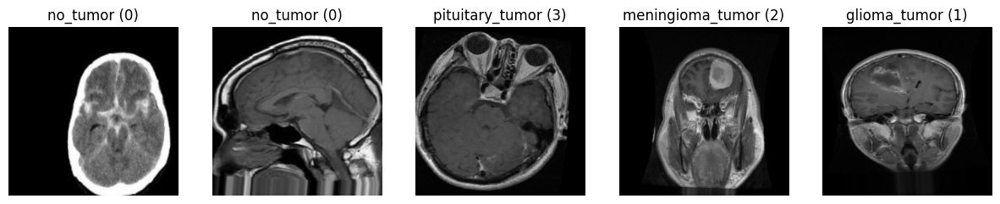

In [ ]:
# import matplotlib.pyplot as plt

# # Get a batch of data from the training generator
# sample_images, sample_labels = next(train_generator)

# # Define the number of sample images to visualize
# num_samples = 5

# # Visualize the sample images
# plt.figure(figsize=(15, 10))
# for i in range(num_samples):
#     plt.subplot(1, num_samples, i + 1)
#     plt.imshow(sample_images[i])
#     class_name = CLASSES[sample_labels[i].argmax()]  # Convert one-hot encoded label to class name
#     class_label = sample_labels[i].argmax()  # Get the numeric label
#     plt.title(f'{class_name} ({class_label})')
#     plt.axis('off')
# plt.show()

# Train Model

In [ ]:
from sklearn.metrics import precision_score, recall_score, roc_auc_score, f1_score

# Create a list of metrics to track during training
custom_metrics = ['accuracy',
                   tf.keras.metrics.Precision(),
                   tf.keras.metrics.Recall(),
                   tf.keras.metrics.AUC(curve='ROC')]


## SE2CNN

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, Dropout
# from tensorflow.keras.models import Model
# from tensorflow.keras.optimizers import Adam

# def SE2Conv2D(filters, kernel_size, strides=(1, 1), padding='same'):
#     def layer(x):
#         x = Conv2D(filters, kernel_size, strides=strides, padding=padding)(x)
#         x = BatchNormalization()(x)
#         x = Activation('relu')(x)
#         return x
#     return layer

# def SE2MaxPooling2D(pool_size=(2, 2)):
#     def layer(x):
#         x = MaxPooling2D(pool_size=pool_size)(x)
#         return x
#     return layer

# def create_SE2CNN_model(input_shape, num_classes, dropout_rate=0.2):
#     input_layer = Input(shape=input_shape)
#     x = input_layer

#     # Apply SE2Conv2D layers and SE2MaxPooling2D layers
#     x = SE2Conv2D(32, (3, 3))(x)
# #     x = BatchNormalization()(x)
#     x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

#     x = SE2Conv2D(64, (3, 3))(x)
# #     x = BatchNormalization()(x)
#     x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

#     x = SE2Conv2D(128, (3, 3))(x)
# #     x = BatchNormalization()(x)
#     x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

#     x = SE2Conv2D(256, (3, 3))(x)
# #     x = BatchNormalization()(x)
#     x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

#     x = SE2Conv2D(512, (3, 3))(x)
# #     x = BatchNormalization()(x)
#     x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

# #     x = GlobalAveragePooling2D()(x)
#     x = Flatten()(x)
#     x = Dense(512, activation='relu')(x)
#     x = BatchNormalization()(x)
#     x = Dropout(dropout_rate)(x)
#     output = Dense(num_classes, activation='softmax')(x)  # Sigmoid for binary / Softmax for multi-class

#     model = Model(inputs=input_layer, outputs=output)

#     return model

# # Define model input shape and number of classes
# input_shape = (224, 224, 3)  # Assuming input images are RGB
# num_classes = 4  # Number of classes

# # Create model
# model_se2cnn = create_SE2CNN_model(input_shape, num_classes)

# # Print model summary
# model_se2cnn.summary()

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, Dropout, Reshape, Permute, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def GroupConv2D(filters, kernel_size, strides=(1, 1), padding='same', groups=3):
    def layer(x):
        group_list = []
        in_channels = x.shape[-1]
        assert in_channels % groups == 0, f"Number of input channels ({in_channels}) must be divisible by the number of groups ({groups})"
        group_size = in_channels // groups

        for i in range(groups):
            x_group = x[:, :, :, i * group_size : (i + 1) * group_size]
            group_conv = Conv2D(filters // groups, kernel_size, strides=strides, padding=padding)(x_group)
            group_list.append(group_conv)

        x = Concatenate()(group_list)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        return x
    return layer

def SE2MaxPooling2D(pool_size=(2, 2)):
    def layer(x):
        x = MaxPooling2D(pool_size=pool_size)(x)
        return x
    return layer

def SE2LiftingLayer(x):
    # Assuming the input shape is (N, H, W, C)
    N, H, W, C = x.shape
    assert C % 3 == 0, "Number of input channels must be divisible by 3 to split into 3 groups"
    group_size = C // 3

    x = Reshape((H, W, 3, group_size))(x)
    x = Permute((1, 2, 4, 3))(x)
    return x

def create_SE2CNN_model(input_shape, num_classes, dropout_rate=0.5):
    input_layer = Input(shape=input_shape)
    x = input_layer

    # Apply GroupConv2D layers and SE2MaxPooling2D layers
    x = GroupConv2D(33, (3, 3))(x)
    x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

    x = GroupConv2D(66, (3, 3))(x)
    x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

    x = GroupConv2D(132, (3, 3))(x)
    x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

    x = GroupConv2D(264, (3, 3))(x)
    x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

    x = GroupConv2D(528, (3, 3))(x)
    x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

    x = GroupConv2D(1056, (3, 3))(x)
    x = SE2MaxPooling2D()(x)
#     x = Dropout(dropout_rate)(x)

    # Apply the lifting layer
    x = SE2LiftingLayer(x)

    x = Flatten()(x)
    x = Dense(1056, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)
    output = Dense(num_classes, activation='softmax')(x)  # Sigmoid for binary / Softmax for multi-class

    model = Model(inputs=input_layer, outputs=output)

    return model

# Define model input shape and number of classes
input_shape = (224, 224, 3)  # Assuming input images are RGB
num_classes = 5  # Number of classes

# Create model
model_se2cnn = create_SE2CNN_model(input_shape, num_classes)

# Print model summary
model_se2cnn.summary()

# Print total number of layers
print(f'Total number of layers: {len(model_se2cnn.layers)}')

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (GetItem)           │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (GetItem)           │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 224, 224,  │        110 │ get_item[0][0]    │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 224, 224,  │        110 │ get_item_1[0][0]  │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 224, 224,  │        110 │ get_item_2[0][0]  │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 224, 224,  │          0 │ conv2d[0][0],     │
│ (Concatenate)       │ 33)               │            │ conv2d_1[0][0],   │
│                     │                   │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 224, 224,  │        132 │ concatenate[0][0] │
│ (BatchNormalizatio… │ 33)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 224, 224,  │          0 │ batch_normalizat… │
│ (Activation)        │ 33)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 33)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_3          │ (None, 112, 112,  │          0 │ max_pooling2d[0]… │
│ (GetItem)           │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_4          │ (None, 112, 112,  │          0 │ max_pooling2d[0]… │
│ (GetItem)           │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_5          │ (None, 112, 112,  │          0 │ max_pooling2d[0]… │
│ (GetItem)           │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 112, 112,  │      2,200 │ get_item_3[0][0]  │
│                     │ 22)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 112, 112,  │      2,200 │ get_item_4[0][0]  │
│                     │ 22)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 12,285,575 (46.87 MB)

 Trainable params: 12,279,305 (46.84 MB)

 Non-trainable params: 6,270 (24.49 KB)

Total number of layers: 50


In [ ]:
# # prompt: search for file with file size of 0 byte in the root_dir

# import os

# def find_zero_byte_files(root_dir):
#     zero_byte_files = []
#     for dirpath, dirnames, filenames in os.walk(root_dir):
#         for filename in filenames:
#             filepath = os.path.join(dirpath, filename)
#             if os.path.getsize(filepath) == 0:
#                 zero_byte_files.append(filepath)
#     return zero_byte_files

# # Example usage
# root_dir = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only'
# zero_byte_files = find_zero_byte_files(root_dir)

# if zero_byte_files:
#     print("Zero-byte files found:")
#     for file in zero_byte_files:
#         print(file)
# else:
#     print("No zero-byte files found in the specified directory.")


Zero-byte files found:
/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20100823121358_3_slice_0055.png
/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20100705113404_4_slice_0000.png
/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20100705113404_4_slice_0001.png
/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20100705113404_4_slice_0002.png


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping

learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience=2,
                                            factor=0.5,
                                            min_lr = 0.00001,
                                            verbose = 1)

# early_stoping = EarlyStopping(monitor='loss',patience= 3,restore_best_weights=True,verbose=0)

# Compile the model
model_se2cnn.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
#     optimizer=tf.keras.optimizers.SGD(learning_rate=0.00001, momentum=0.9),
#     optimizer='adam',
    loss='categorical_crossentropy',
    metrics=custom_metrics
)

# Train the model
# epochs = 30
epochs = 1

# Calculate class weights based on the training data
# class_weights = compute_class_weight('balanced', classes=train_generator.classes, y=train_generator.classes)
# class_weights = {i: class_weights[i] for i in range(num_classes)}

# Train the model using class weights
history = model_se2cnn.fit(
    train_generator,
    callbacks=[learning_rate_reduction],
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(validation_generator)
)

# Evaluate the model on the test data
# test_metrics = model_se2cnn.evaluate(test_generator, steps=len(test_generator))

# # Extract the custom metrics (precision, recall, AUC) from the test metrics
# test_loss = test_metrics[0]
# test_precision = test_metrics[1]
# test_recall = test_metrics[2]
# test_auc = test_metrics[3]

# print(f'Test loss se2cnn: {test_loss}')
# print(f'Test precision se2cnn: {test_precision}')
# print(f'Test recall se2cnn: {test_recall}')
# print(f'Test AUC se2cnn: {test_auc}')

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


8/8 ━━━━━━━━━━━━━━━━━━━━ 871s 103s/step - accuracy: 0.3224 - auc: 0.6196 - loss: 2.8206 - precision: 0.3376 - recall: 0.2504 - val_accuracy: 0.2064 - val_auc: 0.5186 - val_loss: 1.6385 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010


In [ ]:
model_se2cnn.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
#     optimizer=tf.keras.optimizers.SGD(learning_rate=0.00001, momentum=0.9),
#     optimizer='adam',
    loss='categorical_crossentropy',
    metrics=custom_metrics
)

In [ ]:
# prompt: inference image using model_se2cnn, and measure the inference time

import numpy as np
import time

# Load an image for inference
# Replace 'path/to/your/image.jpg' with the actual path to your image
image_path = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/sampled/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20110208115246_2_slice_0010.png'
img = load_img(image_path, target_size=IMG_SIZE)
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.0  # Rescale the image

# Measure inference time
start_time = time.time()
predictions = model_se2cnn.predict(img_array)
end_time = time.time()

# Get the predicted class
predicted_class_index = np.argmax(predictions)
# Get the class names from the training generator
class_names = list(train_generator.class_indices.keys())
predicted_class_name = class_names[predicted_class_index]

print(f"Predicted class: {predicted_class_name}")
print(f"Inference time: {end_time - start_time:.4f} seconds")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted class: Pituitary
Inference time: 0.0699 seconds


1/1 [==============================] - 0s 324ms/step


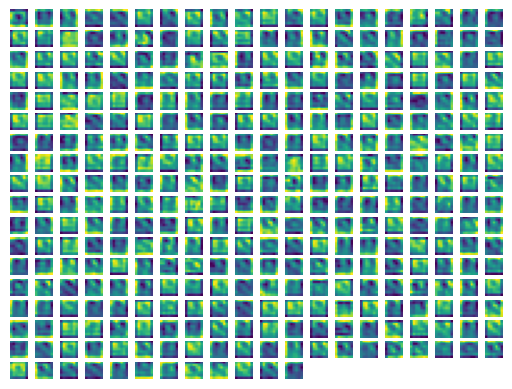

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Choose a layer from which you want to visualize feature maps
layer_name_se2cnn = 'conv2d_87'  # Replace with the actual layer name

# Create a new model that outputs the feature maps at the chosen layer
visualization_model_se2cnn = tf.keras.models.Model(inputs=model_se2cnn.input, outputs=model_se2cnn.get_layer(layer_name_se2cnn).output)

# Load and preprocess an example image from your dataset
image_path = '/kaggle/working/train/glioma_tumor/gg (123).jpg'  # Replace with the actual image path
img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))  # Adjust target_size

# Convert the image to a NumPy array and preprocess it
img = tf.keras.preprocessing.image.img_to_array(img)
img = tf.keras.applications.vgg16.preprocess_input(img)  # Adjust preprocessing for your model

# Reshape the image to match the input shape expected by the model
img = tf.expand_dims(img, axis=0)

# Get the feature maps by predicting on the input image
feature_maps = visualization_model_se2cnn.predict(img)

# Calculate the number of rows and columns based on the number of feature maps
num_feature_maps = feature_maps.shape[-1]
num_rows = int(np.sqrt(num_feature_maps))
num_cols = (num_feature_maps + num_rows - 1) // num_rows

# Visualize the feature maps
for i in range(num_feature_maps):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis')  # Adjust the colormap as needed
    plt.axis('off')

plt.show()


## VGG16

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalMaxPooling2D

# Define input shape (adjust based on your requirements)
input_shape = (224, 224, 3)

# Create VGG16 model
# vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
vgg16_model = VGG16(include_top=False, input_shape=input_shape)

# Freeze all layers
for layer in vgg16_model.layers:
    layer.trainable = True

# Unfreeze the last few layers (fine-tuning)
for layer in vgg16_model.layers[-2:]:
    layer.trainable = True

# Create a new model by adding custom layers on top of VGG19
model_vgg16 = Sequential()

# Add the VGG16 convolutional base
model_vgg16.add(vgg16_model)

# model_vgg16.add(GlobalMaxPooling2D())

# model_vgg16.add(Dense(2, activation='relu'))

# addition = 12

# for _ in range(29):  # Add 30 Dense layers with ReLU activation
#     model_vgg16.add(Dense(8+addition, activation='relu'))
#     model_vgg16.add(Dropout(0.2))
#     addition += 32

# Flatten the output of VGG16
model_vgg16.add(Flatten())

model_vgg16.add(Dense(64, activation='relu'))
# model_vgg16.add(Dropout(0.2, name="Dropout1"))
model_vgg16.add(Dense(128, activation='relu'))
# model_vgg16.add(Dropout(0.2, name="Dropout2"))
model_vgg16.add(Dense(512, activation='relu'))
# model_vgg16.add(Dropout(0.2, name="Dropout3"))

# Add the output layer with the number of classes
num_classes = 5
model_vgg16.add(Dense(num_classes, activation='softmax'))

# Print the model summary
model_vgg16.summary()

# Print total number of layers
print(f'Total number of layers: {len(model_vgg16.layers)}')

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │     1,605,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,397,317 (62.55 MB)

 Trainable params: 16,397,317 (62.55 MB)

 Non-trainable params: 0 (0.00 B)

Total number of layers: 6


In [ ]:
# prompt: inference image using model_se2cnn, and measure the inference time

import numpy as np
import time

# Load an image for inference
# Replace 'path/to/your/image.jpg' with the actual path to your image
image_path = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/sampled/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20110208115246_2_slice_0010.png'
img = load_img(image_path, target_size=IMG_SIZE)
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.0  # Rescale the image

# Measure inference time
start_time = time.time()
predictions = model_vgg16.predict(img_array)
end_time = time.time()

# Get the predicted class
predicted_class_index = np.argmax(predictions)
# Get the class names from the training generator
class_names = list(train_generator.class_indices.keys())
predicted_class_name = class_names[predicted_class_index]

print(f"Predicted class: {predicted_class_name}")
print(f"Inference time: {end_time - start_time:.4f} seconds")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step
Predicted class: Pituitary
Inference time: 1.3151 seconds


In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# Compile the model
model_vgg16.compile(
#     optimizer=tf.keras.optimizers.SGD(learning_rate=0.00001, momentum=0.9),
#     optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    optimizer='adam',
    loss='categorical_crossentropy',  # Adjust the loss function as needed
    metrics=custom_metrics
)

# Train the model
# epochs = 30
epochs = 1

# Calculate class weights based on the training data
# class_weights = compute_class_weight('balanced', classes=train_generator.classes, y=train_generator.classes)
# class_weights = {i: class_weights[i] for i in range(num_classes)}

# Train the model using class weights
history = model_vgg16.fit(
    train_generator,
    callbacks=[learning_rate_reduction],
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(validation_generator)
)

# Evaluate the model on the test data
test_metrics_vgg16 = model_vgg16.evaluate(test_generator, steps=len(test_generator))
test_loss_vgg16 = test_metrics_vgg16[0]  # Test loss is the first element

# Extract the custom metrics (precision, recall, F1) from the test metrics
test_precision_vgg16 = test_metrics_vgg16[1]  # Adjust the index as needed
test_recall_vgg16 = test_metrics_vgg16[2]  # Adjust the index as needed
test_auc_vgg16 = test_metrics_vgg16[3]  # Adjust the index as needed

print(f'Test loss vgg16: {test_loss_vgg16}')
print(f'Test precision vgg16: {test_precision_vgg16}')
print(f'Test recall vgg16: {test_recall_vgg16}')
print(f'Test AUC vgg16: {test_auc_vgg16}')

Epoch 1/30
280/280 [==============================] - 28s 95ms/step - loss: 2.2176 - accuracy: 0.5464 - precision: 0.5862 - recall: 0.3605 - auc: 0.7327 - val_loss: 0.7059 - val_accuracy: 0.7312 - val_precision: 0.7669 - val_recall: 0.6854 - val_auc: 0.9180 - lr: 0.0010
Epoch 2/30
280/280 [==============================] - 27s 95ms/step - loss: 0.9117 - accuracy: 0.6558 - precision: 0.7250 - recall: 0.5567 - auc: 0.8716 - val_loss: 0.6146 - val_accuracy: 0.7729 - val_precision: 0.8235 - val_recall: 0.7000 - val_auc: 0.9384 - lr: 0.0010
Epoch 3/30
280/280 [==============================] - 27s 95ms/step - loss: 0.8560 - accuracy: 0.6701 - precision: 0.7533 - recall: 0.5616 - auc: 0.8824 - val_loss: 0.6535 - val_accuracy: 0.7646 - val_precision: 0.8535 - val_recall: 0.6917 - val_auc: 0.9346 - lr: 0.0010
Epoch 4/30
280/280 [==============================] - ETA: 0s - loss: 0.7827 - accuracy: 0.7027 - precision: 0.7701 - recall: 0.6040 - auc: 0.9014
Epoch 4: ReduceLROnPlateau reducing lear

## VGG19

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalMaxPooling2D

# Define input shape (adjust based on your requirements)
input_shape = (224, 224, 3)

# Create VGG16 model
# vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
vgg19_model = VGG19(include_top=False, input_shape=input_shape)

# Freeze all layers
for layer in vgg19_model.layers:
    layer.trainable = False

# Unfreeze the last few layers (fine-tuning)
for layer in vgg19_model.layers[-1:]:
    layer.trainable = True

# Create a new model by adding custom layers on top of VGG19
model_vgg19 = Sequential()

# Add the VGG19 convolutional base
model_vgg19.add(vgg19_model)

# model_vgg19.add(GlobalMaxPooling2D())

# model_vgg19.add(Dense(2, activation='relu'))

# addition = 12

# for _ in range(29):  # Add 30 Dense layers with ReLU activation
#     model_vgg19.add(Dense(8+addition, activation='relu'))
#     model_vgg19.add(Dropout(0.2))
#     addition += 32

# Flatten the output of VGG16
model_vgg19.add(Flatten())

model_vgg19.add(Dense(64, activation='relu'))
# model_vgg19.add(Dropout(0.2, name="Dropout1"))
model_vgg19.add(Dense(128, activation='relu'))
# model_vgg19.add(Dropout(0.2, name="Dropout2"))
model_vgg19.add(Dense(512, activation='relu'))
# model_vgg19.add(Dropout(0.2, name="Dropout3"))

# Add the output layer with the number of classes
num_classes = 5
model_vgg19.add(Dense(num_classes, activation='softmax'))

# Print the model summary
model_vgg19.summary()

# Print total number of layers
print(f'Total number of layers: {len(model_vgg19.layers)}')

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ (None, 7, 7, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 64)             │     1,605,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,707,013 (82.81 MB)

 Trainable params: 1,682,629 (6.42 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

Total number of layers: 6


In [ ]:
# prompt: inference image using model_se2cnn, and measure the inference time

# Compile the model
model_vgg19.compile(
#     optimizer=tf.keras.optimizers.SGD(learning_rate=0.00001, momentum=0.9),
#     optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    optimizer='adam',
    loss='categorical_crossentropy',  # Adjust the loss function as needed
    metrics=custom_metrics
)

import numpy as np
import time

# Load an image for inference
# Replace 'path/to/your/image.jpg' with the actual path to your image
image_path = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/sampled/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20110208115246_2_slice_0010.png'
img = load_img(image_path, target_size=IMG_SIZE)
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.0  # Rescale the image

# Measure inference time
start_time = time.time()
predictions = model_vgg19.predict(img_array)
end_time = time.time()

# Get the predicted class
predicted_class_index = np.argmax(predictions)
# Get the class names from the training generator
class_names = list(train_generator.class_indices.keys())
predicted_class_name = class_names[predicted_class_index]

print(f"Predicted class: {predicted_class_name}")
print(f"Inference time: {end_time - start_time:.4f} seconds")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
Predicted class: Metastases
Inference time: 0.8244 seconds


In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# Compile the model
model_vgg19.compile(
#     optimizer=tf.keras.optimizers.SGD(learning_rate=0.00001, momentum=0.9),
#     optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    optimizer='adam',
    loss='categorical_crossentropy',  # Adjust the loss function as needed
    metrics=custom_metrics
)

# Train the model
epochs = 30

# Calculate class weights based on the training data
# class_weights = compute_class_weight('balanced', classes=train_generator.classes, y=train_generator.classes)
# class_weights = {i: class_weights[i] for i in range(num_classes)}

# Train the model using class weights
history = model_vgg19.fit(
    train_generator,
    callbacks=[learning_rate_reduction],
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(validation_generator)
)

# Evaluate the model on the test data
test_metrics_vgg19 = model_vgg19.evaluate(test_generator, steps=len(test_generator))
test_loss_vgg19 = test_metrics_vgg19[0]  # Test loss is the first element

# Extract the custom metrics (precision, recall, F1) from the test metrics
test_precision_vgg19 = test_metrics_vgg19[1]  # Adjust the index as needed
test_recall_vgg19 = test_metrics_vgg19[2]  # Adjust the index as needed
test_auc_vgg19 = test_metrics_vgg19[3]  # Adjust the index as needed

print(f'Test loss vgg19: {test_loss_vgg19}')
print(f'Test precision vgg19: {test_precision_vgg19}')
print(f'Test recall vgg19: {test_recall_vgg19}')
print(f'Test AUC vgg19: {test_auc_vgg19}')

Epoch 1/30
280/280 [==============================] - 29s 98ms/step - loss: 3.9091 - accuracy: 0.6036 - precision: 0.6041 - recall: 0.3931 - auc: 0.7305 - val_loss: 3.5044 - val_accuracy: 0.6750 - val_precision: 0.6764 - val_recall: 0.6750 - val_auc: 0.8317 - lr: 0.0010
Epoch 2/30
280/280 [==============================] - 27s 96ms/step - loss: 3.2147 - accuracy: 0.7000 - precision: 0.7004 - recall: 0.6991 - auc: 0.8480 - val_loss: 2.3777 - val_accuracy: 0.8000 - val_precision: 0.8000 - val_recall: 0.8000 - val_auc: 0.9092 - lr: 0.0010
Epoch 3/30
280/280 [==============================] - 27s 97ms/step - loss: 3.1834 - accuracy: 0.7295 - precision: 0.7308 - recall: 0.7295 - auc: 0.8577 - val_loss: 3.3185 - val_accuracy: 0.7458 - val_precision: 0.7458 - val_recall: 0.7458 - val_auc: 0.8619 - lr: 0.0010
Epoch 4/30
280/280 [==============================] - ETA: 0s - loss: 3.0547 - accuracy: 0.7473 - precision: 0.7470 - recall: 0.7460 - auc: 0.8720
Epoch 4: ReduceLROnPlateau reducing lear

## RESNET50

In [ ]:
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import ResNet50

input_shape = (224, 224, 3)

def create_resnet_model50(input_shape):
#     base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model = ResNet50(include_top=False, input_shape=input_shape)

    # Freeze all layers
    for layer in base_model.layers:
        layer.trainable = False

    # Unfreeze the last few layers (fine-tuning)
    for layer in base_model.layers[-100:]:  # Adjust this number to change how many layers to unfreeze
        layer.trainable = True

    model = Sequential([
        base_model,
        layers.Flatten(),
    ])

    # Define the number of extra Dense layers and Dropout layers
    num_layers = 1
    dropout_rate = 0.2

#     # Add extra Dense layers with Dropout
#     for _ in range(num_layers):
#         model.add(layers.Dense(64, activation='relu'))
#         model.add(layers.Dropout(dropout_rate))

    # Add the final Dense layer
    model.add(layers.Dense(4, activation='softmax'))

    optimizer = 'adam'

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=custom_metrics)
    return model

model_resnet50 = create_resnet_model50(input_shape)
model_resnet50.summary()

# Print total number of layers
print(f'Total number of layers: {len(model_resnet50.layers)}')

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 4)              │       401,412 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,989,124 (91.51 MB)

 Trainable params: 22,553,348 (86.03 MB)

 Non-trainable params: 1,435,776 (5.48 MB)

Total number of layers: 3


In [ ]:
# prompt: inference image using model_se2cnn, and measure the inference time

import numpy as np
import time

# Load an image for inference
# Replace 'path/to/your/image.jpg' with the actual path to your image
image_path = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/sampled/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20110208115246_2_slice_0010.png'
img = load_img(image_path, target_size=IMG_SIZE)
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.0  # Rescale the image

# Measure inference time
start_time = time.time()
predictions = model_resnet50.predict(img_array)
end_time = time.time()

# Get the predicted class
predicted_class_index = np.argmax(predictions)
# Get the class names from the training generator
class_names = list(train_generator.class_indices.keys())
predicted_class_name = class_names[predicted_class_index]

print(f"Predicted class: {predicted_class_name}")
print(f"Inference time: {end_time - start_time:.4f} seconds")


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Predicted class: Pituitary
Inference time: 10.2734 seconds


In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping

learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience=2,
                                            factor=0.5,
                                            min_lr = 0.00001,
                                            verbose = 1)

# Train the model
epochs = 30

# Calculate class weights based on the training data
# class_weights = compute_class_weight('balanced', classes=[0, 1, 2, 3], y=train_generator.classes)
# class_weights = {0: class_weights[0], 1: class_weights[1], 2: class_weights[2], 3: class_weights[3]}

# Train the model using class weights
history = model_resnet50.fit(
    train_generator,
    callbacks=[learning_rate_reduction],
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(validation_generator)
)

# Evaluate the model on the test data
test_metrics_resnet50 = model_resnet50.evaluate(test_generator, steps=len(test_generator))
test_loss_resnet50 = test_metrics_resnet50[0]  # Test loss is the first element

# Extract the custom metrics (precision, recall, F1) from the test metrics
test_precision_resnet50 = test_metrics_resnet50[1]  # Adjust the index as needed
test_recall_resnet50 = test_metrics_resnet50[2]  # Adjust the index as needed
test_auc_resnet50 = test_metrics_resnet50[3]  # Adjust the index as needed

print(f'Test loss resnet50: {test_loss_resnet50}')
print(f'Test precision resnet50: {test_precision_resnet50}')
print(f'Test recall resnet50: {test_recall_resnet50}')
print(f'Test AUC resnet50: {test_auc_resnet50}')

Epoch 1/30
280/280 [==============================] - 50s 100ms/step - loss: 3.8500 - accuracy: 0.3232 - precision: 0.3770 - recall: 0.1567 - auc: 0.5929 - val_loss: 19.1891 - val_accuracy: 0.2583 - val_precision: 0.2583 - val_recall: 0.2583 - val_auc: 0.5121 - lr: 0.0010
Epoch 2/30
280/280 [==============================] - 27s 97ms/step - loss: 1.6559 - accuracy: 0.3902 - precision: 0.4463 - recall: 0.1522 - auc: 0.6430 - val_loss: 1.5974 - val_accuracy: 0.2646 - val_precision: 0.5902 - val_recall: 0.1500 - val_auc: 0.5719 - lr: 0.0010
Epoch 3/30
280/280 [==============================] - 27s 96ms/step - loss: 1.3820 - accuracy: 0.4482 - precision: 0.5320 - recall: 0.2411 - auc: 0.6910 - val_loss: 5.2215 - val_accuracy: 0.2375 - val_precision: 0.2324 - val_recall: 0.1792 - val_auc: 0.4888 - lr: 0.0010
Epoch 4/30
280/280 [==============================] - 27s 96ms/step - loss: 1.2124 - accuracy: 0.4714 - precision: 0.5493 - recall: 0.2960 - auc: 0.7420 - val_loss: 5.1480 - val_accurac

## RESNET101

In [ ]:
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet101

input_shape = (224, 224, 3)

def create_resnet_model101(input_shape):
#     base_model = ResNet101(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model = ResNet101(include_top=False, input_shape=input_shape)

#     # Freeze all layers
#     for layer in base_model.layers:
#         layer.trainable = False

#     # Unfreeze the last few layers (fine-tuning)
#     for layer in base_model.layers[-240:]:  # Adjust this number to change how many layers to unfreeze
#         layer.trainable = True

    model = Sequential([
        base_model,
        layers.Flatten(),
    ])

#     # Define the number of extra Dense layers and Dropout layers
#     num_layers = 32
#     dropout_rate = 0.5

#     # Add extra Dense layers with Dropout
#     for _ in range(num_layers):
#         model.add(layers.Dense(64, activation='relu'))
#         model.add(layers.Dropout(dropout_rate))

#     model.add(layers.Dropout(dropout_rate))

    # Add the final Dense layer
    model.add(layers.Dense(4, activation='softmax'))

    optimizer = 'adam'

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=custom_metrics)
    return model

model_resnet101 = create_resnet_model101(input_shape)
model_resnet101.summary()

# Print total number of layers
print(f'Total number of layers: {len(model_resnet101.layers)}')

171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet101 (Functional)          │ (None, 7, 7, 2048)     │    42,658,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 4)              │       401,412 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,059,588 (164.26 MB)

 Trainable params: 42,954,244 (163.86 MB)

 Non-trainable params: 105,344 (411.50 KB)

Total number of layers: 3


In [ ]:
# prompt: inference image using model_se2cnn, and measure the inference time

import numpy as np
import time

# Load an image for inference
# Replace 'path/to/your/image.jpg' with the actual path to your image
image_path = '/content/drive/MyDrive/Brain_tumor_classification_data/classification_only/sampled/Schwannoma/patient_AX_T1+C(3D_2MM)_ZIP_512_20110208115246_2_slice_0010.png'
img = load_img(image_path, target_size=IMG_SIZE)
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.0  # Rescale the image

# Measure inference time
start_time = time.time()
predictions = model_resnet101.predict(img_array)
end_time = time.time()

# Get the predicted class
predicted_class_index = np.argmax(predictions)
# Get the class names from the training generator
class_names = list(train_generator.class_indices.keys())
predicted_class_name = class_names[predicted_class_index]

print(f"Predicted class: {predicted_class_name}")
print(f"Inference time: {end_time - start_time:.4f} seconds")


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Predicted class: Pituitary
Inference time: 10.3045 seconds


In [ ]:
# from sklearn.utils.class_weight import compute_class_weight

# Train the model
epochs = 30

# Calculate class weights based on the training data
# class_weights = compute_class_weight('balanced', classes=[0, 1, 2, 3], y=train_generator.classes)
# class_weights = {0: class_weights[0], 1: class_weights[1], 2: class_weights[2], 3: class_weights[3]}

# Train the model using class weights
history = model_resnet101.fit(
    train_generator,
    callbacks=[learning_rate_reduction],
    epochs=epochs,
    validation_data=validation_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(validation_generator)
)

# Evaluate the model on the test data
test_metrics_resnet101 = model_resnet101.evaluate(test_generator, steps=len(test_generator))
test_loss_resnet101 = test_metrics_resnet101[0]  # Test loss is the first element

# Extract the custom metrics (precision, recall, F1) from the test metrics
test_precision_resnet101 = test_metrics_resnet101[1]  # Adjust the index as needed
test_recall_resnet101 = test_metrics_resnet101[2]  # Adjust the index as needed
test_auc_resnet101 = test_metrics_resnet101[3]  # Adjust the index as needed

print(f'Test loss resnet101: {test_loss_resnet101}')
print(f'Test precision resnet101: {test_precision_resnet101}')
print(f'Test recall resnet101: {test_recall_resnet101}')
print(f'Test AUC resnet101: {test_auc_resnet101}')

Epoch 1/30
280/280 [==============================] - 109s 127ms/step - loss: 3.8656 - accuracy: 0.3362 - precision: 0.5023 - recall: 0.2768 - auc: 0.6621 - val_loss: 1.8858 - val_accuracy: 0.2500 - val_precision: 0.2500 - val_recall: 0.2500 - val_auc: 0.5161 - lr: 0.0010
Epoch 2/30
280/280 [==============================] - 34s 121ms/step - loss: 1.8887 - accuracy: 0.4138 - precision: 0.5078 - recall: 0.1455 - auc: 0.6598 - val_loss: 1.3887 - val_accuracy: 0.2500 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.5000 - lr: 0.0010
Epoch 3/30
280/280 [==============================] - 34s 121ms/step - loss: 1.6168 - accuracy: 0.4621 - precision: 0.5421 - recall: 0.2241 - auc: 0.7182 - val_loss: 1.2954 - val_accuracy: 0.4104 - val_precision: 0.0714 - val_recall: 0.0021 - val_auc: 0.6849 - lr: 0.0010
Epoch 4/30
280/280 [==============================] - 34s 121ms/step - loss: 1.4917 - accuracy: 0.5134 - precision: 0.5617 - recall: 0.3375 - auc: 0.7517 - val_loss: 1.3962 - 

# Prediction Result

## SE2CNN

60/60 [==============================] - 1s 16ms/step - loss: 0.2665 - accuracy: 0.9062 - precision: 0.9099 - recall: 0.9042 - auc: 0.9853
Test accuracy se2cnn: 0.90625
Test precision se2cnn: 0.9098532199859619
Test recall se2cnn: 0.9041666388511658
Test F1 score se2cnn: 0.9070010162843318
Test AUC se2cnn: 0.9852885603904724
60/60 [==============================] - 1s 15ms/step


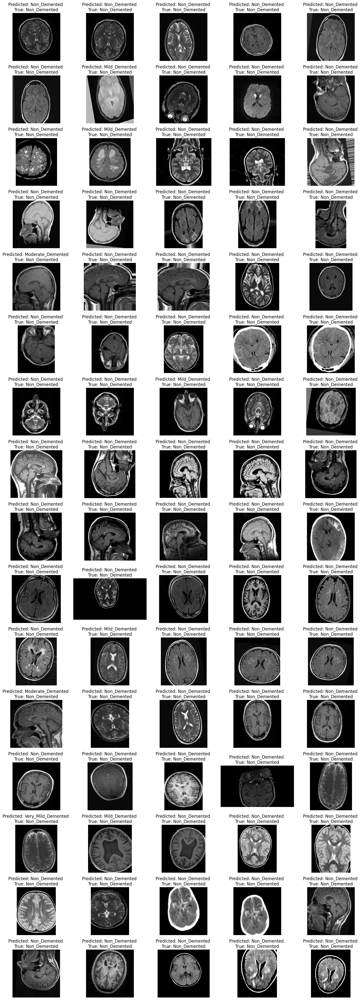

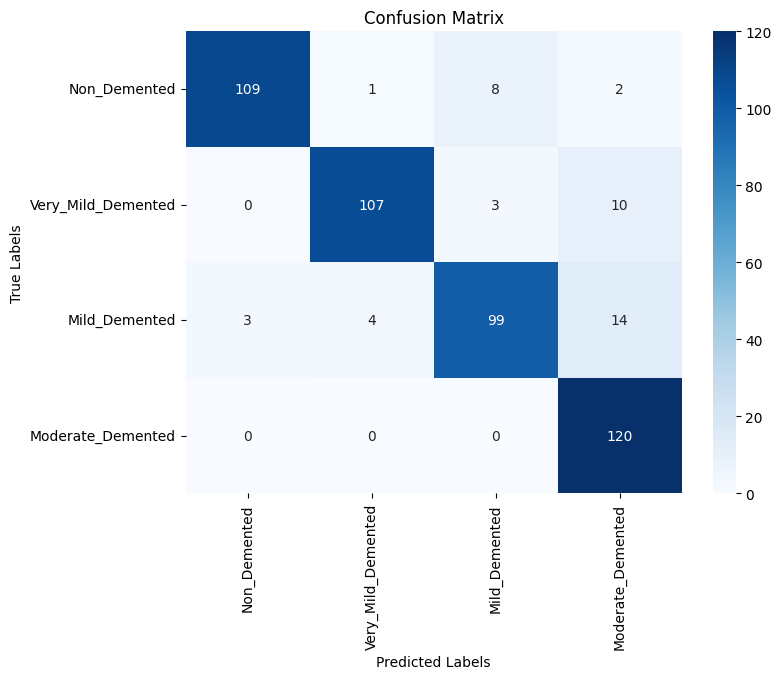

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import os

# Evaluate the model on the test data
test_metrics = model_se2cnn.evaluate(test_generator)

# Print the evaluation metrics
test_accuracy = test_metrics[1]
test_precision = test_metrics[2]
test_recall = test_metrics[3]
test_auc = test_metrics[4]

# Calculate F1 score
test_f1_score = 2 * (test_precision * test_recall) / (test_precision + test_recall)

# Print the evaluation metrics including F1 score
print(f'Test accuracy se2cnn: {test_accuracy}')
print(f'Test precision se2cnn: {test_precision}')
print(f'Test recall se2cnn: {test_recall}')
print(f'Test F1 score se2cnn: {test_f1_score}')
print(f'Test AUC se2cnn: {test_auc}')

# Define label names
label_names = ['Non_Demented', 'Very_Mild_Demented', 'Mild_Demented', 'Moderate_Demented']

# Define the number of rows and columns for the grid
rows = 16
cols = 5

# Calculate the total number of images
total_images = rows * cols

# Predict labels for the test data
predictions_se2cnn = model_se2cnn.predict(test_generator)

# Decode the predictions to get predicted labels
predicted_labels_se2cnn = np.argmax(predictions_se2cnn, axis=1)

# Adjust the calculation of true labels if needed, assuming one-hot encoded labels
true_labels_se2cnn = test_generator.labels

# Get filenames from the test generator
filenames = test_generator.filenames

# Create a figure and axis objects
fig, axes = plt.subplots(rows, cols, figsize=(15, 40))

# fig.suptitle("SE2CNN", fontsize=16, fontweight='bold', x=0.5, y=1.02)

# Plot images with predicted and true labels
for i in range(total_images):
    # Load and display the image
    img = plt.imread(os.path.join(test_dir, filenames[i]))
    ax = axes[i // cols, i % cols]
    ax.imshow(img)
    ax.axis('off')

    # Get predicted and true label names
    predicted_label_name = label_names[predicted_labels_se2cnn[i]]
    true_label_name = label_names[true_labels_se2cnn[i]]

    # Display predicted and true label names with image name
    ax.set_title(f'Predicted: {predicted_label_name} \nTrue: {true_label_name}', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels_se2cnn, predicted_labels_se2cnn)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

## VGG16

60/60 [==============================] - 1s 24ms/step - loss: 0.3663 - accuracy: 0.8833 - precision: 0.8889 - recall: 0.8667 - auc: 0.9750
Test accuracy VGG16: 0.8833333253860474
Test precision VGG16: 0.8888888955116272
Test recall VGG16: 0.8666666746139526
Test F1 score VGG16: 0.8776371381046336
Test AUC VGG16: 0.9750304222106934
60/60 [==============================] - 1s 21ms/step


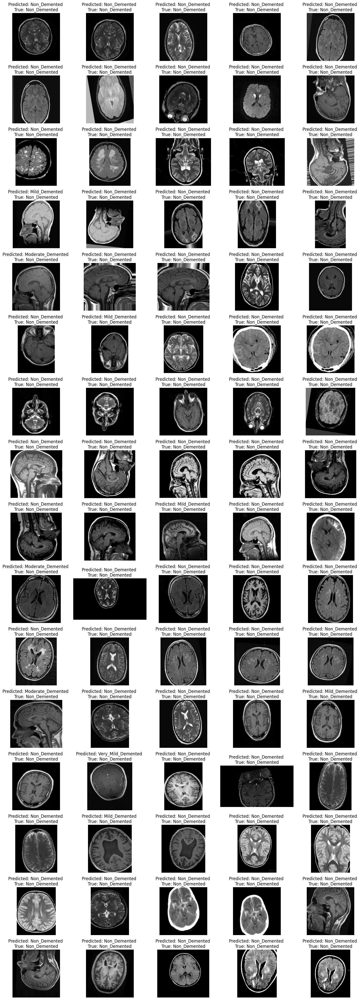

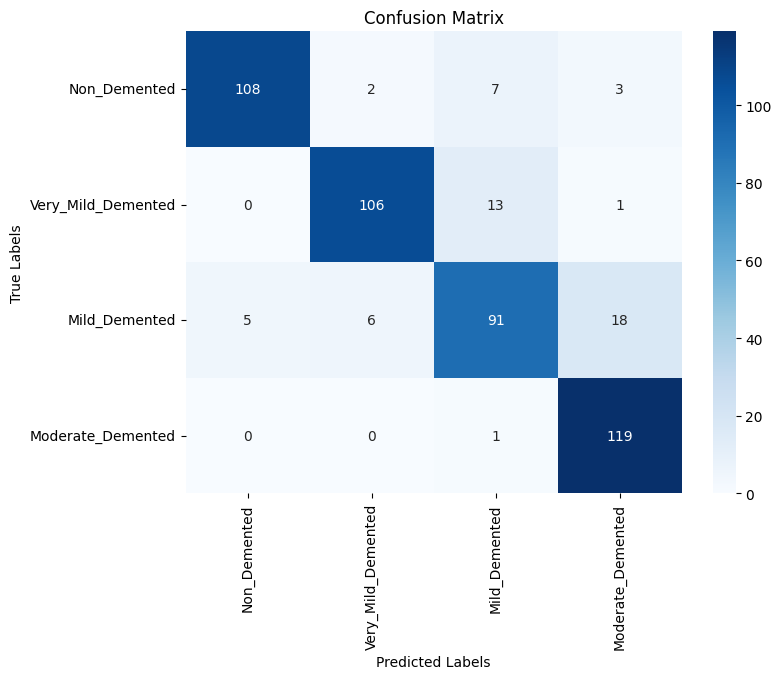

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import os

# Evaluate the model on the test data
test_metrics_vgg16 = model_vgg16.evaluate(test_generator)

# Print the evaluation metrics
test_accuracy_vgg16 = test_metrics_vgg16[1]
test_precision_vgg16 = test_metrics_vgg16[2]
test_recall_vgg16 = test_metrics_vgg16[3]
test_auc_vgg16 = test_metrics_vgg16[4]

# Calculate F1 score
test_f1_score_vgg16 = 2 * (test_precision_vgg16 * test_recall_vgg16) / (test_precision_vgg16 + test_recall_vgg16)

# Print the evaluation metrics including F1 score
print(f'Test accuracy VGG16: {test_accuracy_vgg16}')
print(f'Test precision VGG16: {test_precision_vgg16}')
print(f'Test recall VGG16: {test_recall_vgg16}')
print(f'Test F1 score VGG16: {test_f1_score_vgg16}')
print(f'Test AUC VGG16: {test_auc_vgg16}')

# Define label names
label_names = ['Non_Demented', 'Very_Mild_Demented', 'Mild_Demented', 'Moderate_Demented']

# Define the number of rows and columns for the grid
rows = 16
cols = 5

# Calculate the total number of images
total_images = rows * cols

# Predict labels for the test data
predictions_vgg16 = model_vgg16.predict(test_generator)

# Decode the predictions to get predicted labels
predicted_labels_vgg16 = np.argmax(predictions_vgg16, axis=1)

# Adjust the calculation of true labels if needed, assuming one-hot encoded labels
true_labels_vgg16 = test_generator.labels

# Get filenames from the test generator
filenames = test_generator.filenames

# Create a figure and axis objects
fig, axes = plt.subplots(rows, cols, figsize=(15, 40))

# Plot images with predicted and true labels
for i in range(total_images):
    # Load and display the image
    img = plt.imread(os.path.join(test_dir, filenames[i]))
    ax = axes[i // cols, i % cols]
    ax.imshow(img)
    ax.axis('off')

    # Get predicted and true label names
    predicted_label_name = label_names[predicted_labels_vgg16[i]]
    true_label_name = label_names[true_labels_vgg16[i]]

    # Display predicted and true label names with image name
    ax.set_title(f'Predicted: {predicted_label_name} \nTrue: {true_label_name}', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels_vgg16, predicted_labels_vgg16)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

## VGG19

60/60 [==============================] - 2s 29ms/step - loss: 0.8582 - accuracy: 0.8813 - precision: 0.8810 - recall: 0.8792 - auc: 0.9498
Test accuracy VGG16: 0.8812500238418579
Test precision VGG16: 0.8810020685195923
Test recall VGG16: 0.8791666626930237
Test F1 score VGG16: 0.8800834086768703
Test AUC VGG16: 0.9497866034507751
60/60 [==============================] - 2s 26ms/step


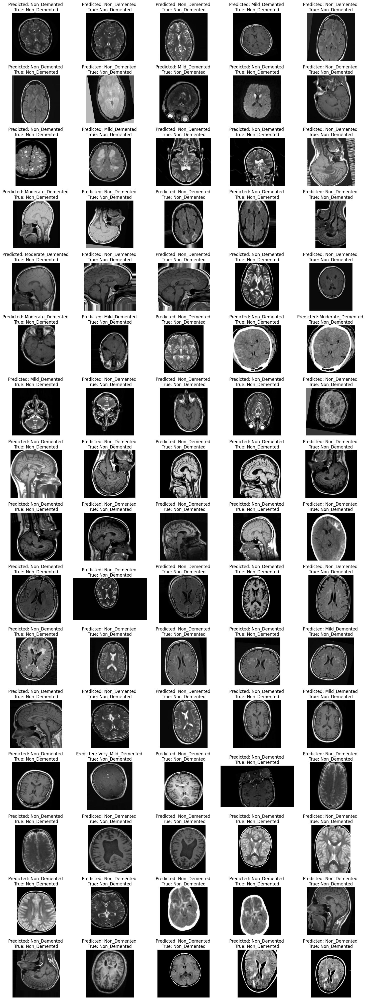

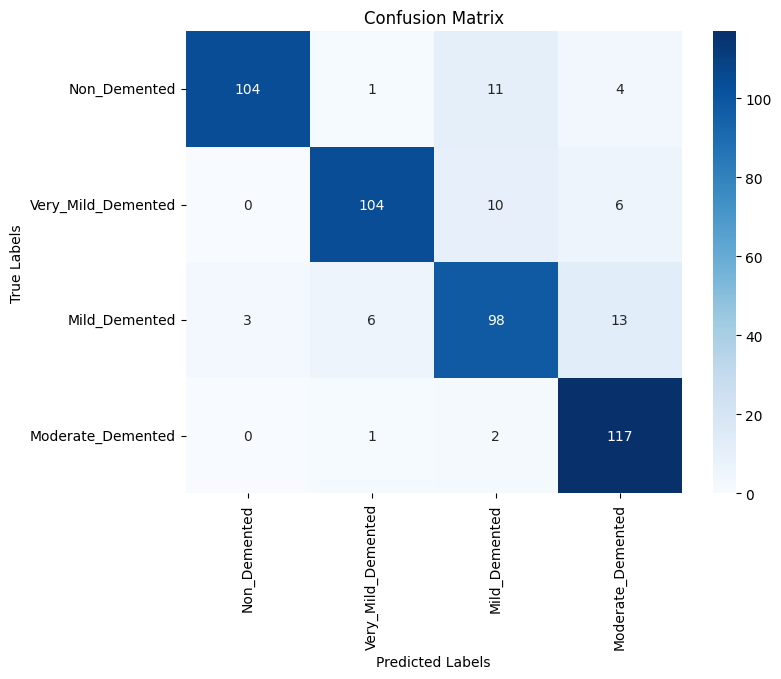

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import os

# Evaluate the model on the test data
test_metrics_vgg19 = model_vgg19.evaluate(test_generator)

# Print the evaluation metrics
test_accuracy_vgg19 = test_metrics_vgg19[1]
test_precision_vgg19 = test_metrics_vgg19[2]
test_recall_vgg19 = test_metrics_vgg19[3]
test_auc_vgg19 = test_metrics_vgg19[4]

# Calculate F1 score
test_f1_score_vgg19 = 2 * (test_precision_vgg19 * test_recall_vgg19) / (test_precision_vgg19 + test_recall_vgg19)

# Print the evaluation metrics including F1 score
print(f'Test accuracy VGG16: {test_accuracy_vgg19}')
print(f'Test precision VGG16: {test_precision_vgg19}')
print(f'Test recall VGG16: {test_recall_vgg19}')
print(f'Test F1 score VGG16: {test_f1_score_vgg19}')
print(f'Test AUC VGG16: {test_auc_vgg19}')

# Define label names
label_names = ['Non_Demented', 'Very_Mild_Demented', 'Mild_Demented', 'Moderate_Demented']

# Define the number of rows and columns for the grid
rows = 16
cols = 5

# Calculate the total number of images
total_images = rows * cols

# Predict labels for the test data
predictions_vgg19 = model_vgg19.predict(test_generator)

# Decode the predictions to get predicted labels
predicted_labels_vgg19 = np.argmax(predictions_vgg19, axis=1)

# Adjust the calculation of true labels if needed, assuming one-hot encoded labels
true_labels_vgg19 = test_generator.labels

# Get filenames from the test generator
filenames = test_generator.filenames

# Create a figure and axis objects
fig, axes = plt.subplots(rows, cols, figsize=(15, 40))

# Plot images with predicted and true labels
for i in range(total_images):
    # Load and display the image
    img = plt.imread(os.path.join(test_dir, filenames[i]))
    ax = axes[i // cols, i % cols]
    ax.imshow(img)
    ax.axis('off')

    # Get predicted and true label names
    predicted_label_name = label_names[predicted_labels_vgg19[i]]
    true_label_name = label_names[true_labels_vgg19[i]]

    # Display predicted and true label names with image name
    ax.set_title(f'Predicted: {predicted_label_name} \nTrue: {true_label_name}', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels_vgg19, predicted_labels_vgg19)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

## RESNET50

60/60 [==============================] - 1s 23ms/step - loss: 0.4746 - accuracy: 0.8313 - precision: 0.8348 - recall: 0.8104 - auc: 0.9605
Test accuracy resnet50: 0.831250011920929
Test precision resnet50: 0.8347639441490173
Test recall resnet50: 0.8104166388511658
Test F1 score resnet50: 0.8224101315585653
Test AUC resnet50: 0.9604542851448059
60/60 [==============================] - 2s 22ms/step


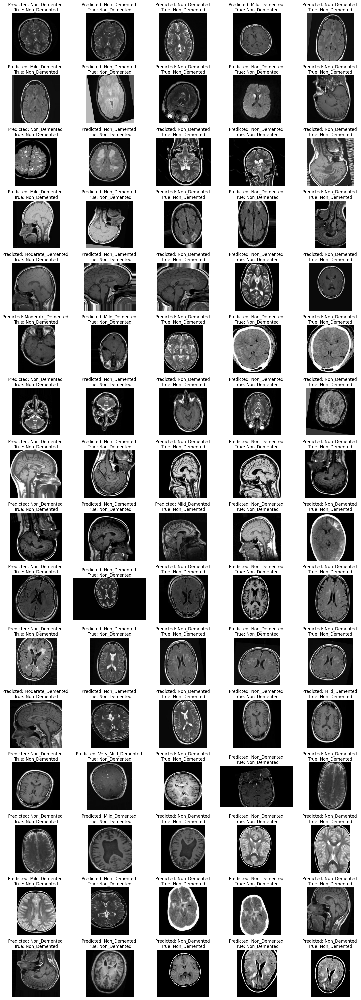

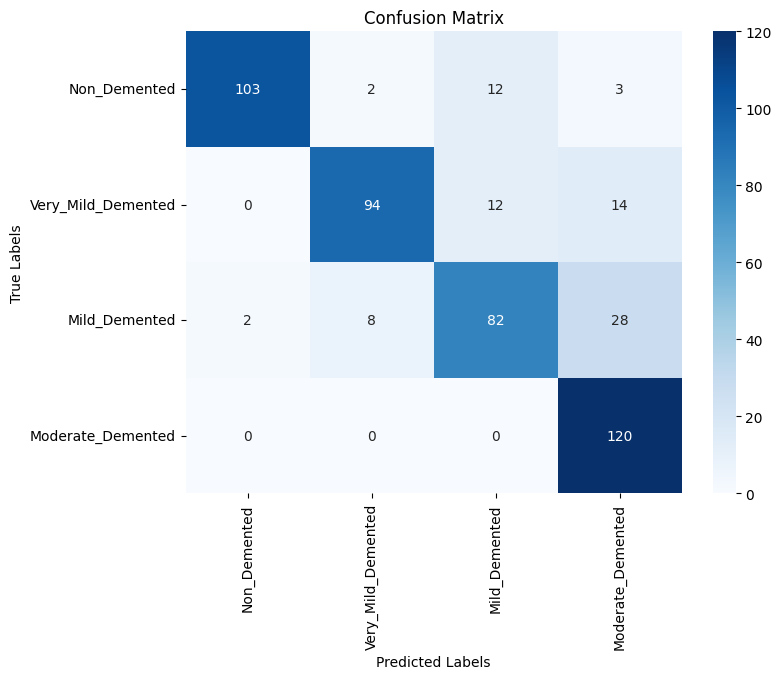

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import os

# Evaluate the model on the test data
test_metrics_resnet50 = model_resnet50.evaluate(test_generator)

# Print the evaluation metrics
test_accuracy_resnet50 = test_metrics_resnet50[1]
test_precision_resnet50 = test_metrics_resnet50[2]
test_recall_resnet50 = test_metrics_resnet50[3]
test_auc_resnet50 = test_metrics_resnet50[4]

# Calculate F1 score
test_f1_score_resnet50 = 2 * (test_precision_resnet50 * test_recall_resnet50) / (test_precision_resnet50 + test_recall_resnet50)

# Print the evaluation metrics including F1 score
print(f'Test accuracy resnet50: {test_accuracy_resnet50}')
print(f'Test precision resnet50: {test_precision_resnet50}')
print(f'Test recall resnet50: {test_recall_resnet50}')
print(f'Test F1 score resnet50: {test_f1_score_resnet50}')
print(f'Test AUC resnet50: {test_auc_resnet50}')

# Define label names
label_names = ['Non_Demented', 'Very_Mild_Demented', 'Mild_Demented', 'Moderate_Demented']

# Define the number of rows and columns for the grid
rows = 16
cols = 5

# Calculate the total number of images
total_images = rows * cols

# Predict labels for the test data
predictions_resnet50 = model_resnet50.predict(test_generator)

# Decode the predictions to get predicted labels
predicted_labels_resnet50 = np.argmax(predictions_resnet50, axis=1)

# Adjust the calculation of true labels if needed, assuming one-hot encoded labels
true_labels_resnet50 = test_generator.labels

# Get filenames from the test generator
filenames = test_generator.filenames

# Create a figure and axis objects
fig, axes = plt.subplots(rows, cols, figsize=(15, 40))

# Plot images with predicted and true labels
for i in range(total_images):
    # Load and display the image
    img = plt.imread(os.path.join(test_dir, filenames[i]))
    ax = axes[i // cols, i % cols]
    ax.imshow(img)
    ax.axis('off')

    # Get predicted and true label names
    predicted_label_name = label_names[predicted_labels_resnet50[i]]
    true_label_name = label_names[true_labels_resnet50[i]]

    # Display predicted and true label names with image name
    ax.set_title(f'Predicted: {predicted_label_name} \nTrue: {true_label_name}', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels_resnet50, predicted_labels_resnet50)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

## RESNET101

60/60 [==============================] - 2s 37ms/step - loss: 0.3204 - accuracy: 0.8625 - precision: 0.8820 - recall: 0.8562 - auc: 0.9817
Test accuracy resnet50: 0.862500011920929
Test precision resnet50: 0.8819742202758789
Test recall resnet50: 0.856249988079071
Test F1 score resnet50: 0.868921755855626
Test AUC resnet50: 0.9816848039627075
60/60 [==============================] - 4s 32ms/step


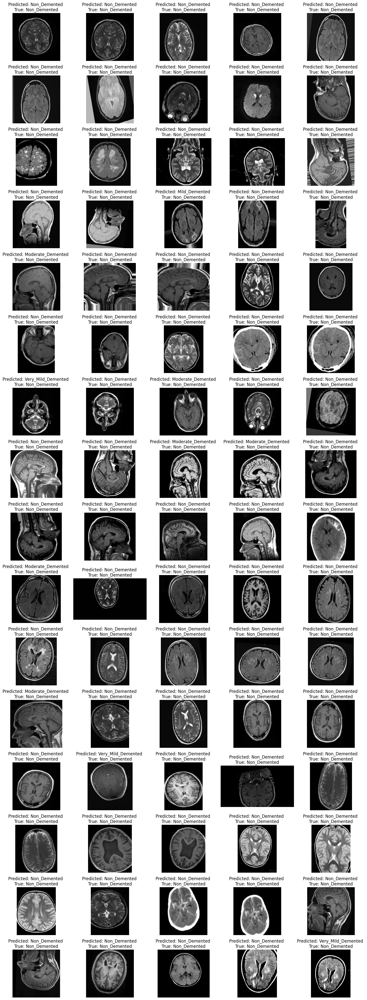

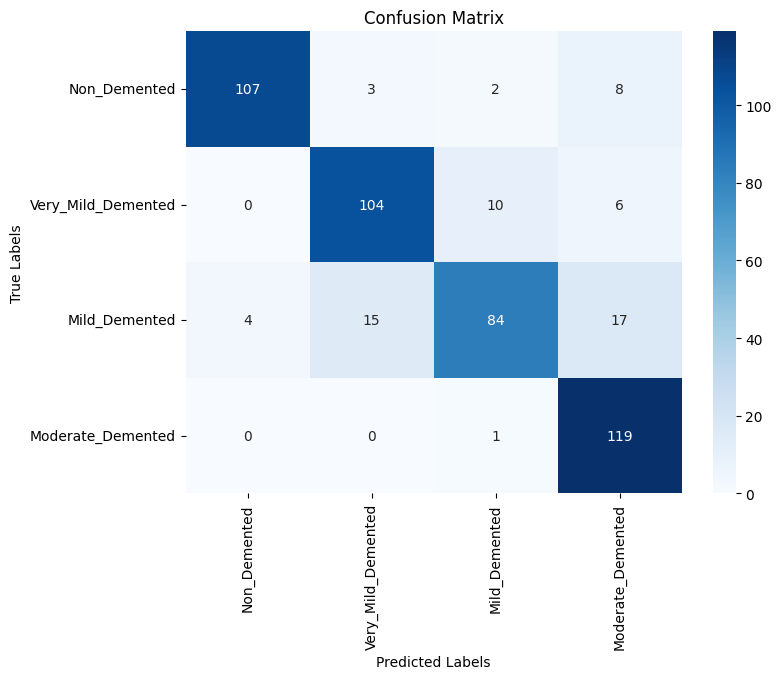

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import os

# Evaluate the model on the test data
test_metrics_resnet101 = model_resnet101.evaluate(test_generator)

# Print the evaluation metrics
test_accuracy_resnet101 = test_metrics_resnet101[1]
test_precision_resnet101 = test_metrics_resnet101[2]
test_recall_resnet101 = test_metrics_resnet101[3]
test_auc_resnet101 = test_metrics_resnet101[4]

# Calculate F1 score
test_f1_score_resnet101 = 2 * (test_precision_resnet101 * test_recall_resnet101) / (test_precision_resnet101 + test_recall_resnet101)

# Print the evaluation metrics including F1 score
print(f'Test accuracy resnet50: {test_accuracy_resnet101}')
print(f'Test precision resnet50: {test_precision_resnet101}')
print(f'Test recall resnet50: {test_recall_resnet101}')
print(f'Test F1 score resnet50: {test_f1_score_resnet101}')
print(f'Test AUC resnet50: {test_auc_resnet101}')

# Define label names
label_names = ['Non_Demented', 'Very_Mild_Demented', 'Mild_Demented', 'Moderate_Demented']

# Define the number of rows and columns for the grid
rows = 16
cols = 5

# Calculate the total number of images
total_images = rows * cols

# Predict labels for the test data
predictions_resnet101 = model_resnet101.predict(test_generator)

# Decode the predictions to get predicted labels
predicted_labels_resnet101 = np.argmax(predictions_resnet101, axis=1)

# Adjust the calculation of true labels if needed, assuming one-hot encoded labels
true_labels_resnet101 = test_generator.labels

# Get filenames from the test generator
filenames = test_generator.filenames

# Create a figure and axis objects
fig, axes = plt.subplots(rows, cols, figsize=(15, 40))

# Plot images with predicted and true labels
for i in range(total_images):
    # Load and display the image
    img = plt.imread(os.path.join(test_dir, filenames[i]))
    ax = axes[i // cols, i % cols]
    ax.imshow(img)
    ax.axis('off')

    # Get predicted and true label names
    predicted_label_name = label_names[predicted_labels_resnet101[i]]
    true_label_name = label_names[true_labels_resnet101[i]]

    # Display predicted and true label names with image name
    ax.set_title(f'Predicted: {predicted_label_name} \nTrue: {true_label_name}', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels_resnet101, predicted_labels_resnet101)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()